In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import sys
sys.path.insert(0, '/content/')
import segmentation_models_pytorch as smp
import torch.nn.functional as F
import preprocess
import os
import pandas as pd
import dataset as ds
import numpy as np
import random
import segmentation_models_pytorch as smp
import test_helper as th 
import loss as lossfile 

In [ ]:
!pip install -q -U segmentation-models-pytorch albumentations > /dev/null
import segmentation_models_pytorch as smp

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! unzip /content/drive/MyDrive/DATASET/archive.zip -d data/

Archive:  /content/drive/MyDrive/DATASET/archive.zip
  inflating: data/label_class_dict.csv  
  inflating: data/metadata.csv       
  inflating: data/png/test/22828930_15.png  
  inflating: data/png/test/22828990_15.png  
  inflating: data/png/test/22829050_15.png  
  inflating: data/png/test/23429020_15.png  
  inflating: data/png/test/23429080_15.png  
  inflating: data/png/test/23578960_15.png  
  inflating: data/png/test/23579005_15.png  
  inflating: data/png/test/23729035_15.png  
  inflating: data/png/test/23879080_15.png  
  inflating: data/png/test/24179065_15.png  
  inflating: data/png/test_labels/22828930_15.png  
  inflating: data/png/test_labels/22828990_15.png  
  inflating: data/png/test_labels/22829050_15.png  
  inflating: data/png/test_labels/23429020_15.png  
  inflating: data/png/test_labels/23429080_15.png  
  inflating: data/png/test_labels/23578960_15.png  
  inflating: data/png/test_labels/23579005_15.png  
  inflating: data/png/test_labels/23729035_15.png  
  

In [ ]:
DATA_DIR = '/content/data/tiff/'
x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'val_labels')

x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'test_labels')

In [ ]:
class_dict = pd.read_csv('/content/data/'+"label_class_dict.csv")
class_names = class_dict['name'].tolist()
class_rgb_values = class_dict[['r', 'g', 'b']].values.tolist()
print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['background', 'building']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]


In [ ]:
select_classes = ['background', 'building']
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]
print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

Selected classes and their corresponding RGB values in labels:
Class Names:  ['background', 'building']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]


In [ ]:
import loss 
import importlib
importlib.reload(loss)
importlib.reload(th)

<module 'test_helper' from '/content/test_helper.py'>

In [ ]:
#Load best model of tversky loss 
# def test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,prediction_dir,model_file,select_classes,loss,metrics):

loss = lossfile.TverskyLoss(0.6,0.4)

metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]

preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')

Loaded UNet model from this run.


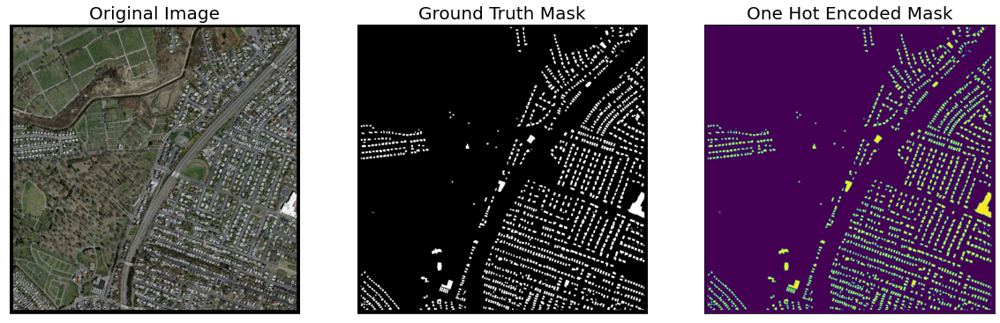

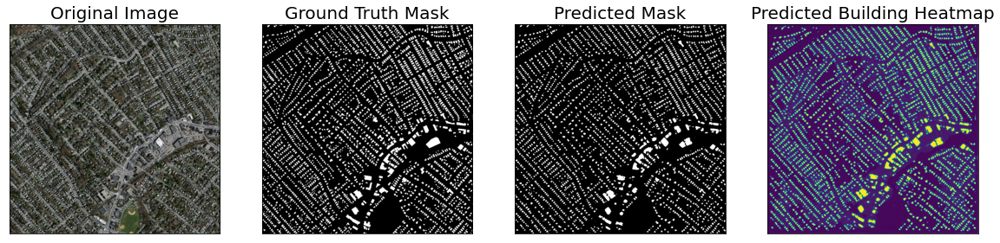

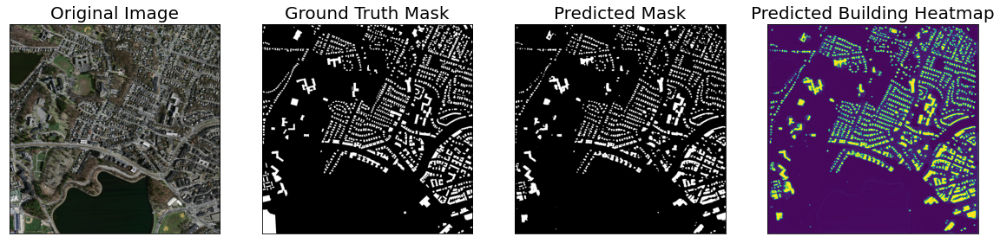

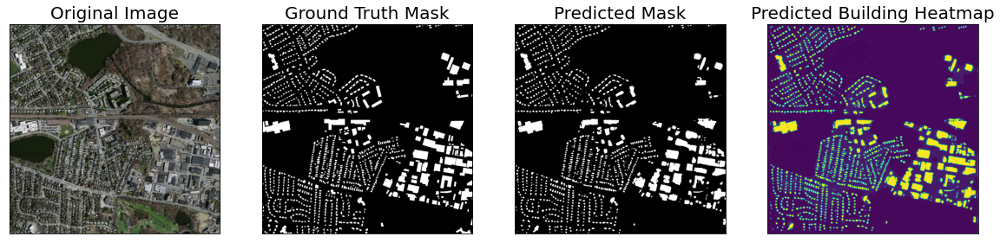

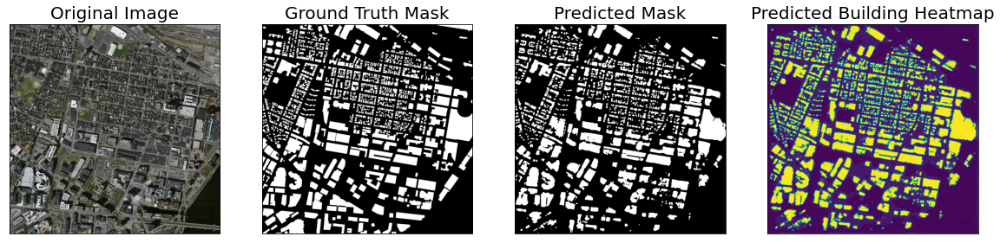

...

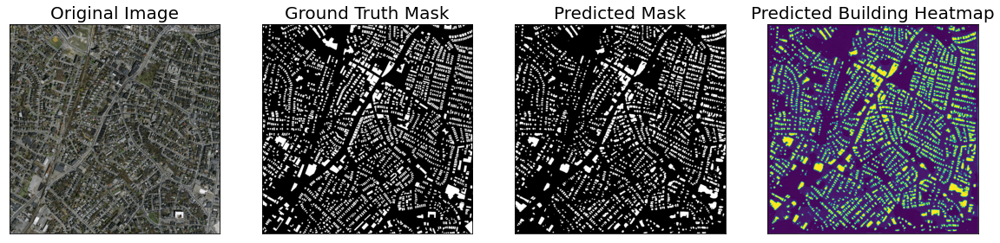

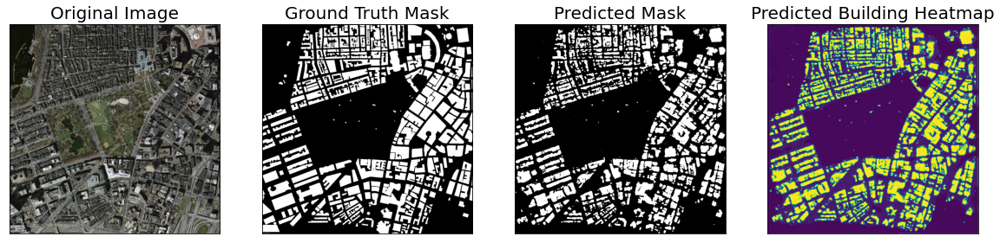

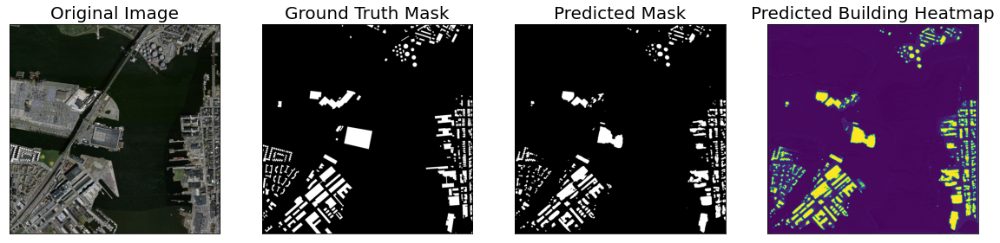

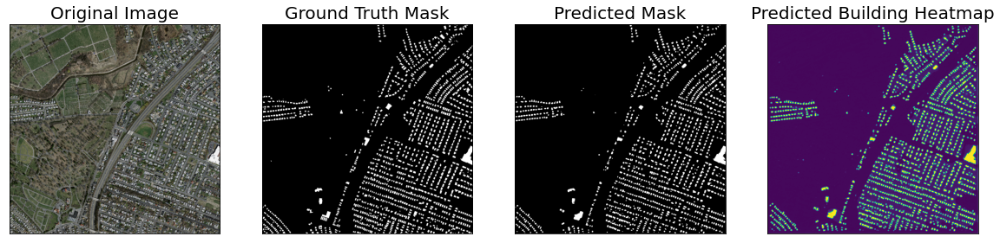

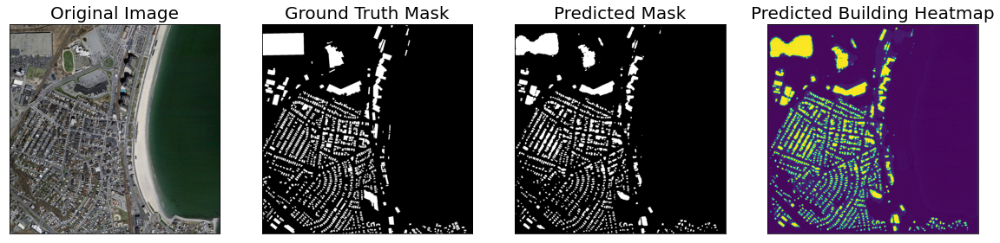

valid:  10%|█         | 1/10 [00:13<02:02, 13.56s/it, <bound method TverskyLoss.__name__ of TverskyLoss()> - 0.3861, iou_score - 0.8062]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1805: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


valid: 100%|██████████| 10/10 [02:15<00:00, 13.55s/it, <bound method TverskyLoss.__name__ of TverskyLoss()> - 0.3853, iou_score - 0.8101]
Evaluation on Test Data: 
Mean IoU Score: 0.810094345


In [ ]:
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'Tverskey_loss_prediction',"tversky_loss_2.pth",select_classes,loss,metrics)

In [ ]:
#Load best model of BCE loss 

loss = lossfile.BCELoss()

metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')

Loaded UNet model from this run.


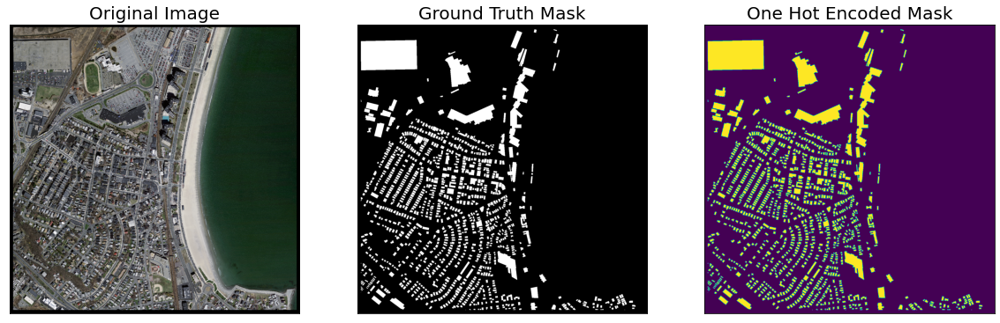

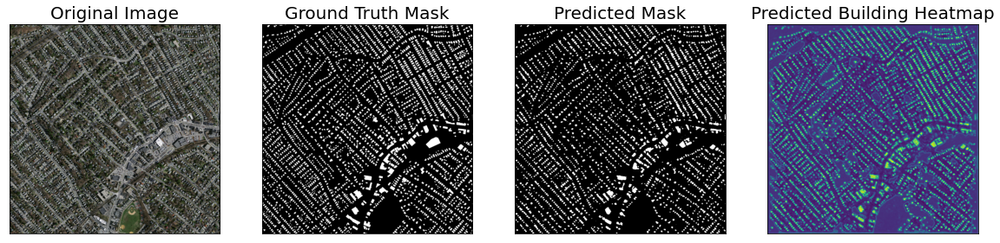

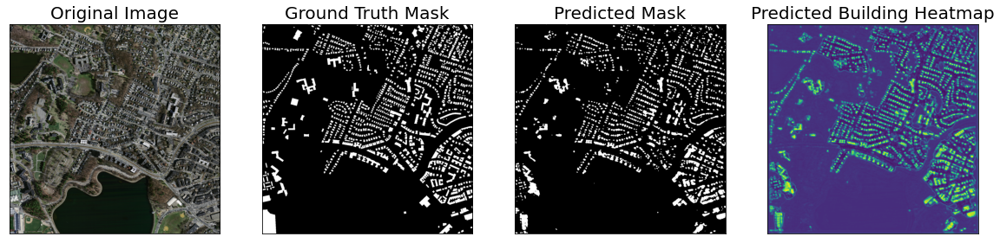

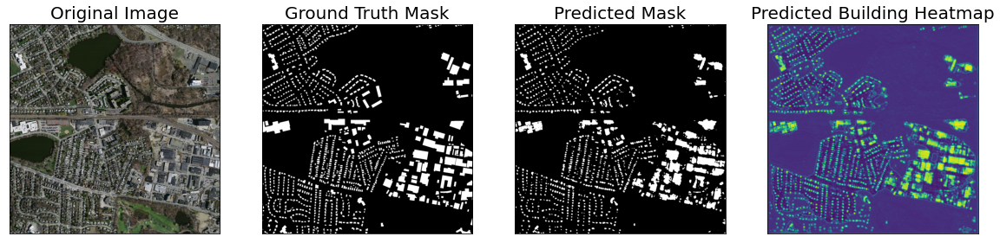

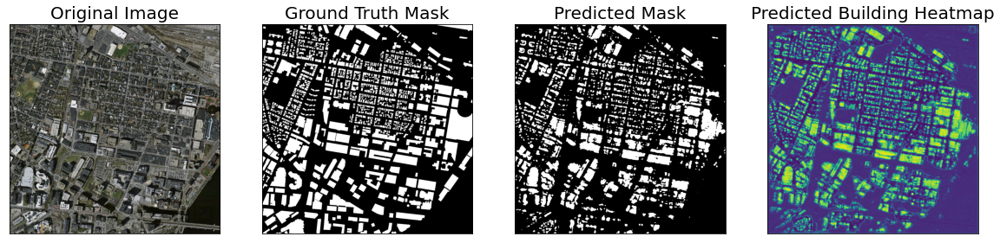

...

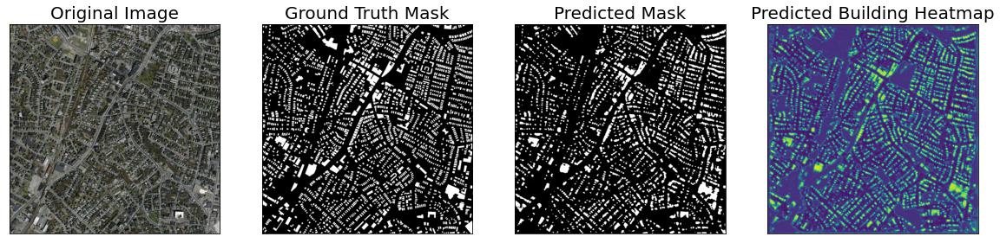

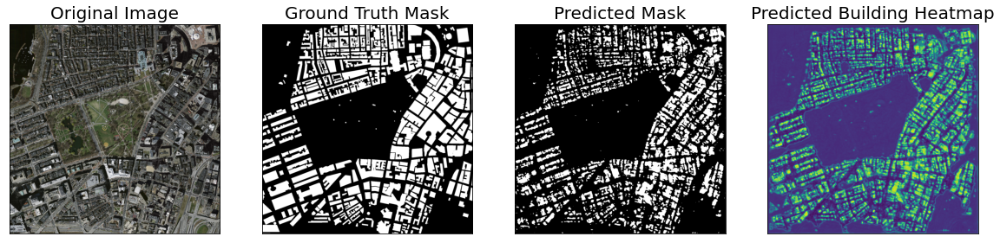

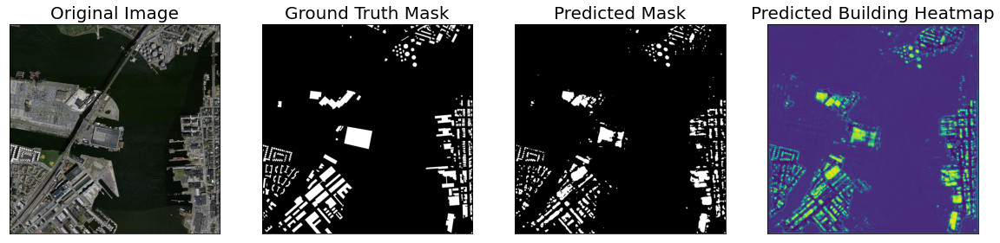

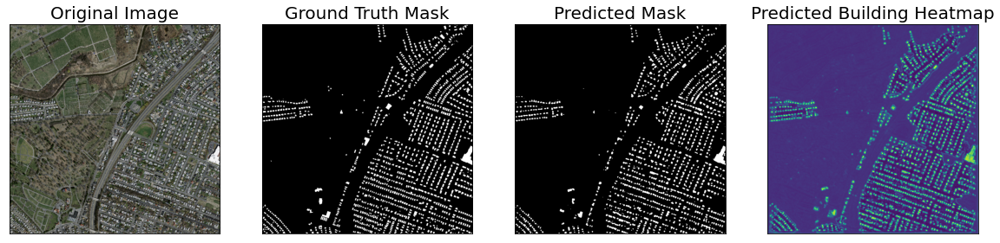

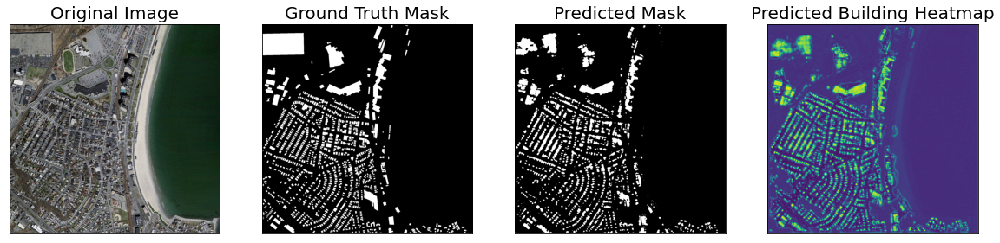

valid: 100%|██████████| 10/10 [02:16<00:00, 13.62s/it, <bound method BCELoss.__name__ of BCELoss()> - 0.3925, iou_score - 0.7823]
Evaluation on Test Data: 
Mean IoU Score: 0.782281202


In [ ]:
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'bce_loss_prediction',"bce_loss.pth",select_classes,loss,metrics)

In [ ]:
#Load best model of BCE loss 

loss = lossfile.LogCosDiceLoss()

metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')

Loaded UNet model from this run.


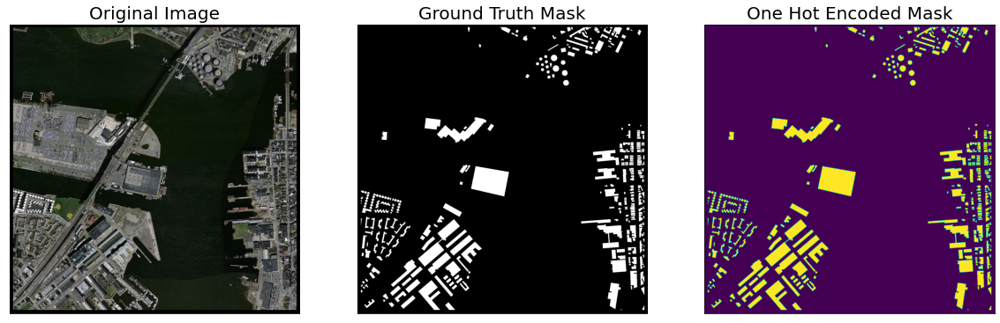

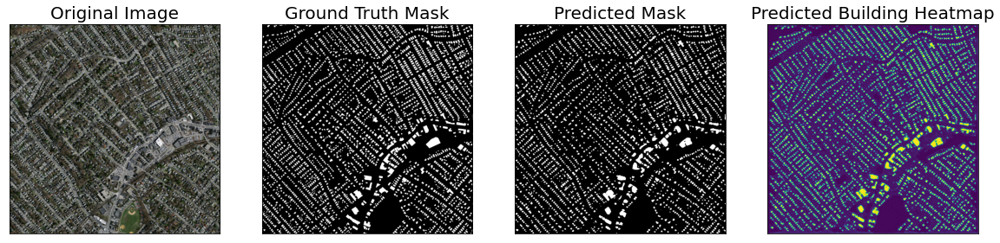

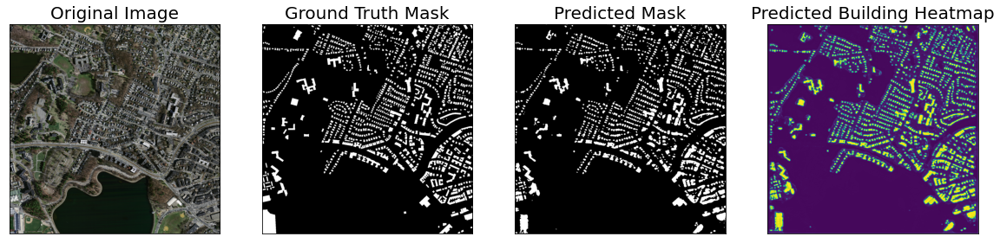

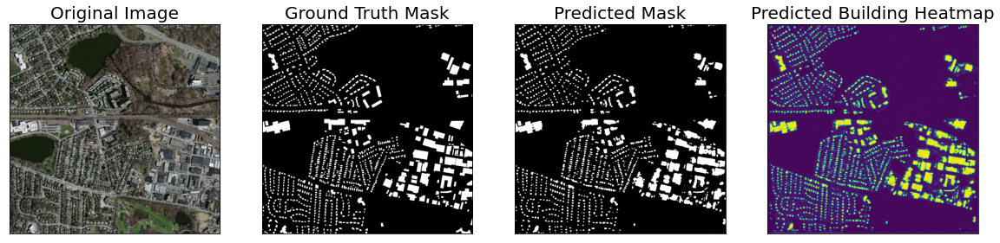

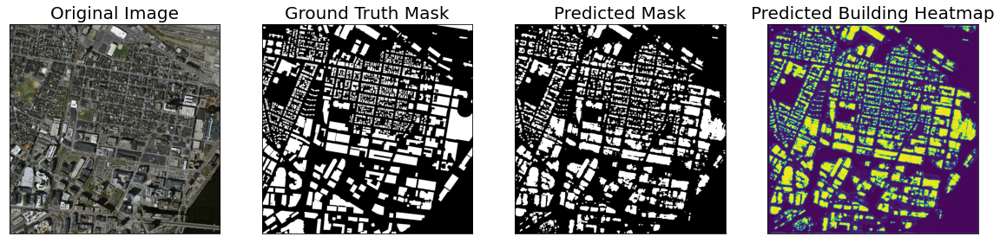

...

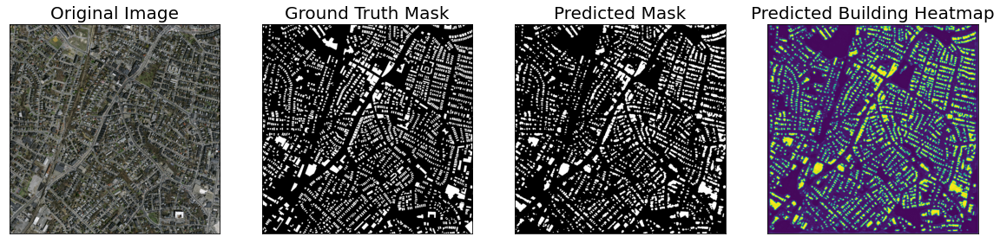

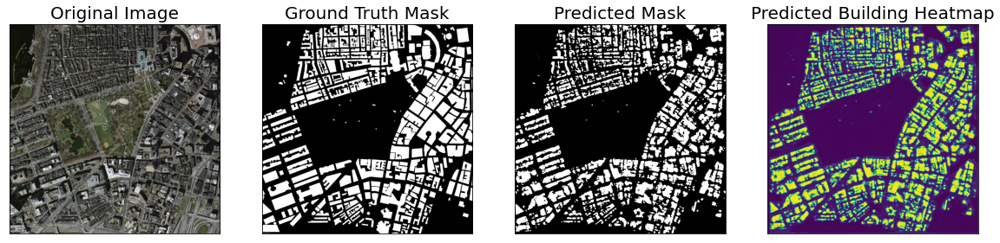

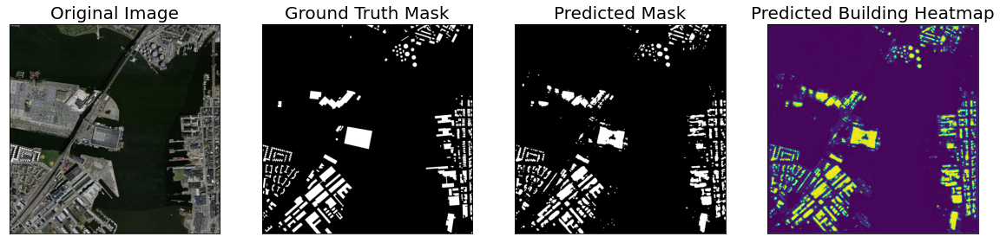

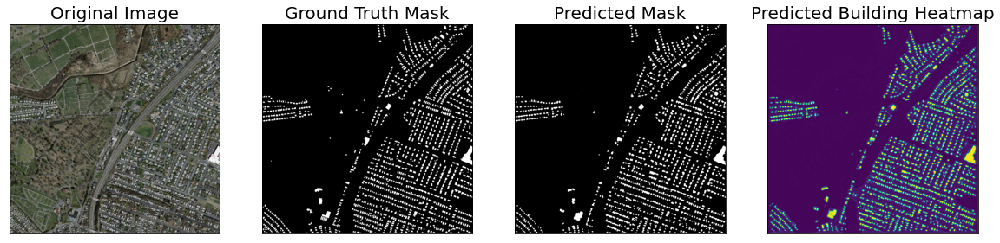

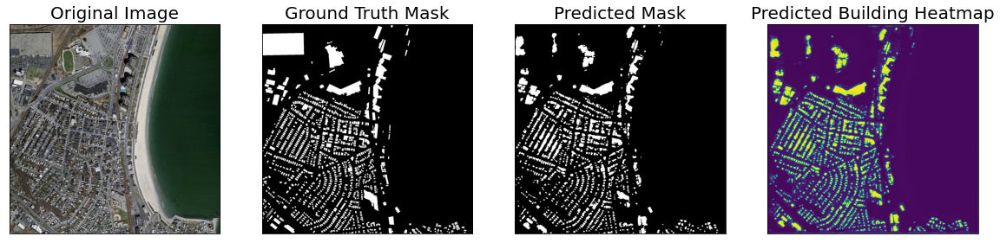

valid: 100%|██████████| 10/10 [02:19<00:00, 13.92s/it, <bound method LogCosDiceLoss.__name__ of LogCosDiceLoss()> - 0.01677, iou_score - 0.8009]
Evaluation on Test Data: 
Mean IoU Score: 0.800871968


In [ ]:
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'log_cos_dice_loss_prediction',"log_cos_dice_loss.pth",select_classes,loss,metrics)

In [ ]:
import utils
importlib.reload(utils)
importlib.reload(th)
# factor_dict = utils.parse_loss_factor('/content/custom_loss1_iou.txt')

<module 'test_helper' from '/content/test_helper.py'>

In [ ]:
factor_dict

{'bce_loss.pth': 0.32687016164724225,
 'log_cos_dice_loss.pth': 0.3346381697931814,
 'tversky_loss.pth': 0.3384916685595763}

In [ ]:

loss = lossfile.CustomLoss1(factor_dict['tversky_loss.pth'],factor_dict['log_cos_dice_loss.pth'],factor_dict['bce_loss.pth'])

metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')

In [ ]:
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss_1_prediction',"/content/drive/MyDrive/CV-MODELS/custom_loss1.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid:  10%|█         | 1/10 [00:15<02:20, 15.57s/it, <bound method CustomLoss1.__name__ of CustomLoss1()> - 0.2295, iou_score - 0.8122]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1805: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


valid: 100%|██████████| 10/10 [02:35<00:00, 15.52s/it, <bound method CustomLoss1.__name__ of CustomLoss1()> - 0.2259, iou_score - 0.8174]


In [ ]:

loss = lossfile.CustomLoss1(factor_dict['tversky_loss.pth'],factor_dict['log_cos_dice_loss.pth'],factor_dict['bce_loss.pth'])

metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss_1_prediction',"/content/drive/MyDrive/CV-MODELS/custom_loss12.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid:  10%|█         | 1/10 [00:16<02:24, 16.06s/it, <bound method CustomLoss1.__name__ of CustomLoss1()> - 0.2242, iou_score - 0.8184]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1805: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


valid: 100%|██████████| 10/10 [02:35<00:00, 15.57s/it, <bound method CustomLoss1.__name__ of CustomLoss1()> - 0.22, iou_score - 0.8237]


In [ ]:

loss = lossfile.CustomLoss1(factor_dict['tversky_loss.pth'],factor_dict['log_cos_dice_loss.pth'],factor_dict['bce_loss.pth'])

metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
  ]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss_1_prediction',"/content/drive/MyDrive/CV-MODELS/custom_loss13.pth",select_classes,loss,metrics)

In [ ]:
#Training the model only for accuracy

In [ ]:
importlib.reload(th)
#for this purpose I modified the test helper file as required.
#finding the model accuracy on test dataset using combined loss function
loss = lossfile.CustomLoss1(factor_dict['tversky_loss.pth'],factor_dict['log_cos_dice_loss.pth'],factor_dict['bce_loss.pth'])

metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss_1_prediction',"/content/drive/MyDrive/CV-MODELS/custom_loss13.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
Model accuracy on test dataset:  0.9271807352701822


In [ ]:
#Load best model of BCE loss 
#finding the model accuracy on test dataset using BCE loss function

loss = lossfile.BCELoss()

metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'BCElossprecition',"/content/drive/MyDrive/CV-MODELS/bce_loss.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
Model accuracy on test dataset:  0.8899678548177083


In [ ]:
#finding the model accuracy on test dataset using TverskyLoss loss function

loss = lossfile.TverskyLoss(0.6,0.4)

metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'tversky_loss',"/content/tversky_loss.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
Model accuracy on test dataset:  0.8650992499457466


In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function

loss = lossfile.LogCosDiceLoss()

metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'LogCosDiceLoss',"/content/log_cos_dice_loss.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
Model accuracy on test dataset:  0.9083557552761501


In [ ]:
import utils
importlib.reload(utils)
importlib.reload(th)

<module 'test_helper' from '/content/test_helper.py'>

In [ ]:
##Testing phase 2

In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
lambda_ = 0.1
loss = lossfile.CustomLoss2(lambda_)
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss2_lambda=0.1',"/content/drive/MyDrive/CV-MODELS/custom_loss2_lambda = 0.1.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid: 100%|██████████| 10/10 [02:36<00:00, 15.62s/it, <bound method CustomLoss2.__name__ of CustomLoss2()> - 0.2831, iou_score - 0.8084]
Accuracy on test dataset : 
 0.9132025400797525


In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
lambda_ = 0.2
loss = lossfile.CustomLoss2(lambda_)
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss2_lambda=0.2',"/content/drive/MyDrive/CV-MODELS/custom_loss2_lambda = 0.2.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid: 100%|██████████| 10/10 [02:37<00:00, 15.72s/it, <bound method CustomLoss2.__name__ of CustomLoss2()> - 0.2567, iou_score - 0.8103]
Accuracy on test dataset : 
 0.9149511973063152


In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
lambda_ = 0.3
loss = lossfile.CustomLoss2(lambda_)
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss2_lambda=0.3',"/content/drive/MyDrive/CV-MODELS/custom_loss2_lambda = 0.3.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid: 100%|██████████| 10/10 [02:40<00:00, 16.03s/it, <bound method CustomLoss2.__name__ of CustomLoss2()> - 0.2458, iou_score - 0.8068]
Accuracy on test dataset : 
 0.9098744710286459


In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
lambda_ = 0.4
loss = lossfile.CustomLoss2(lambda_)
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss2_lambda=0.4',"/content/drive/MyDrive/CV-MODELS/custom_loss2_lambda = 0.4.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid: 100%|██████████| 10/10 [02:34<00:00, 15.48s/it, <bound method CustomLoss2.__name__ of CustomLoss2()> - 0.2425, iou_score - 0.8085]
Accuracy on test dataset : 
 0.9087905459933812


In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
lambda_ = 0.5
loss = lossfile.CustomLoss2(lambda_)
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss2_lambda=0.5',"/content/drive/MyDrive/CV-MODELS/custom_loss2_lambda = 0.5.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid: 100%|██████████| 10/10 [02:35<00:00, 15.54s/it, <bound method CustomLoss2.__name__ of CustomLoss2()> - 0.243, iou_score - 0.8117]
Accuracy on test dataset : 
 0.9124671936035156


In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
lambda_ = 0.6
loss = lossfile.CustomLoss2(lambda_)
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss2_lambda=0.6',"/content/drive/MyDrive/CV-MODELS/custom_loss2_lambda = 0.6.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid: 100%|██████████| 10/10 [02:34<00:00, 15.50s/it, <bound method CustomLoss2.__name__ of CustomLoss2()> - 0.2199, iou_score - 0.8053]
Accuracy on test dataset : 
 0.911333253648546


In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
lambda_ = 0.7
loss = lossfile.CustomLoss2(lambda_)
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss2_lambda=0.7',"/content/drive/MyDrive/CV-MODELS/custom_loss2_lambda = 0.7.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid: 100%|██████████| 10/10 [02:35<00:00, 15.59s/it, <bound method CustomLoss2.__name__ of CustomLoss2()> - 0.2002, iou_score - 0.8121]
Accuracy on test dataset : 
 0.9131169213189019


In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
lambda_ = 0.8
loss = lossfile.CustomLoss2(lambda_)
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss2_lambda=0.8',"/content/drive/MyDrive/CV-MODELS/custom_loss2_lambda = 0.8.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid: 100%|██████████| 10/10 [02:35<00:00, 15.56s/it, <bound method CustomLoss2.__name__ of CustomLoss2()> - 0.173, iou_score - 0.8118]
Accuracy on test dataset : 
 0.911851289537218


In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
lambda_ = 0.9
loss = lossfile.CustomLoss2(lambda_)
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'custom_loss2_lambda=0.9',"/content/drive/MyDrive/CV-MODELS/custom_loss2_lambda = 0.9.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
valid: 100%|██████████| 10/10 [02:38<00:00, 15.90s/it, <bound method CustomLoss2.__name__ of CustomLoss2()> - 0.1962, iou_score - 0.8064]
Accuracy on test dataset : 
 0.9065316942003037


## ***Progress 2 ended here***

In [ ]:
#@title Trainig for the ensemble 

In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
loss = lossfile.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'DiceLossResnet',"/content/drive/MyDrive/CV-MODELS/DiceLossResnet-1.pth",select_classes,loss,metrics)

Loaded UNet model from this run.


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
valid: 100%|██████████| 10/10 [02:36<00:00, 15.61s/it, <bound method DiceLoss.__name__ of DiceLoss()> - 0.1277, iou_score - 0.8246]
Accuracy on test dataset : 
 0.9176989661322701


In [ ]:
#finding the model accuracy on test dataset using log cosh dice loss function
loss = lossfile.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
preprocessing_fn = smp.encoders.get_preprocessing_fn('vgg16', 'imagenet')
th.test(x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,'DiceLossResnet',"/content/drive/MyDrive/CV-MODELS/DiceLossVgg-2.pth",select_classes,loss,metrics)

Loaded UNet model from this run.
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
(1536, 1536, 2) (1536, 1536, 2)
valid: 100%|██████████| 10/10 [02:38<00:00, 15.87s/it, <bound method DiceLoss.__name__ of DiceLoss()> - 0.1087, iou_score - 0.8241]
Accuracy on test dataset : 
 0.9221948835584852


## **Save the prediction of model 1**

In [ ]:
importlib.reload(th)
loss = lossfile.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
file1 = "/content/drive/MyDrive/CV-MODELS/DiceLossResnet-1.pth"
preprocessing_fn = smp.encoders.get_preprocessing_fn('resnet50', 'imagenet')
th.save_prediction("/content/drive/MyDrive/CV-MODELS/resnet",file1,x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,loss,metrics)

## **Save the prediction of model 2**

In [ ]:
importlib.reload(th)
loss = lossfile.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold = 0.5),
]
file2 = "/content/drive/MyDrive/CV-MODELS/DiceLossVgg-2.pth"
preprocessing_fn = smp.encoders.get_preprocessing_fn('vgg16', 'imagenet')
th.save_prediction("/content/drive/MyDrive/CV-MODELS/vgg",file2,x_test_dir,y_test_dir,preprocessing_fn,select_class_rgb_values,loss,metrics)

Loaded UNet model from this run.


# **Combine the result from the both predictions**

# **Combine by iou score**

In [ ]:
importlib.reload(th)
model1_preds_file = "/content/drive/MyDrive/CV-MODELS/resnet_predictions_.npy"
model2_preds_file = "/content/drive/MyDrive/CV-MODELS/vgg_predictions_.npy"
model1_gt_file = "/content/drive/MyDrive/CV-MODELS/resnet_targets_.npy"
model2_gt_file = "/content/drive/MyDrive/CV-MODELS/vgg_targets_.npy"
em1 = 0.8246 
em2 = 0.8241 
th.combine_predictions(model1_preds_file,model2_preds_file,model1_gt_file,model2_gt_file,em1,em2)

IOU SCORE  0.8281513188752987
ACCURACY SCORE  0.9069746653238931


## **Combine by accuracy score**

In [ ]:
importlib.reload(th)
model1_preds_file = "/content/drive/MyDrive/CV-MODELS/resnet_predictions_.npy"
model2_preds_file = "/content/drive/MyDrive/CV-MODELS/vgg_predictions_.npy"
model1_gt_file = "/content/drive/MyDrive/CV-MODELS/resnet_targets_.npy"
model2_gt_file = "/content/drive/MyDrive/CV-MODELS/vgg_targets_.npy"
em1 = 0.9176989661322701
em2 = 0.9221948835584852
th.combine_predictions(model1_preds_file,model2_preds_file,model1_gt_file,model2_gt_file,em1,em2)